# Airbnb Investment in Melbourne, Australia

### Smart property investment using data science and machine learning

#### Applied Data Science Capstone Project by IBM/Coursera

##### 19/01/2020


## Table of contents
* [Introduction : Business problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Airbnb Data Visualization](#airbnb)
* [Housing Data Visualization](#housing)
* [Clustering Data Visualization](#cluster)

## Introduction : Business problem <a name="introduction"></a>

**Airbnb** has become one of the biggest players in the world's holiday accommodation industry. It exists in **more than 65,000 cities across 190+ countries all over the world**.

**Infik** published in 2019, the list of the top Airbnb cities, based on **AirDNA** database. The city of Melbourne was number 10 with 19.055 Airbnb Listings.

As the sporting and cultural capital of Australia, Melbourne has so much to offer visitors from all over the world. It is a culturally diverse city offering some of the best living standards throughout Australia.

This is where I decided to capitalize on the short-term rental demand created by Airbnb.

The study is part of 'The Battle of Neighborhoods' Coursera Applied data science capstone project. It concludes the wonderful IBM Data science Professional Certificate set of courses, which I highly recommand to anyone who is into data science and Machine Learning.

My task is to understand the revenue potential of short-term vacation in Melbourne, and explore the performance of specific neighborhoods. 

The main questions will be : 

* Are there any clusters of similar neighborhoods in Melbourne ?
* Where should I invest ? Is there any significant relationship between cluster and housing price ?
* What are the significant caracteristics that allow us to predict the property price ? And what confidence level do we have in our model ?
* Are there any specific features that can help us maximize the rental revenues ?

At the end, I would like to share with ou my insights, being able, to estimate the right price versus the estimated annual rental revenue.

## Data <a name="data"></a>

### Melbourne Housing Market

**Melbourne_housing_FULL** : The dataset was taken from Kaggle. The data was scraped from publicly available results posted every week from **Domain.com.au**. It was cleaned by Tony Pino and last updated in august 2018. The dataset includes Address, Type of Real estate, Suburb, Method of Selling, Rooms, Price, Real Estate Agent, Date of Sale and distance from C.B.D.

The features are :
* **_Suburb_**
* **_Address_**
* **_Rooms_**: Number of rooms
* **_Price_**: Price in Australian dollars
* **_Method_**: S - property sold; SP - property sold prior; PI - property passed in; PN - sold prior not disclosed; SN - sold not disclosed; NB - no bid; VB - vendor bid; W - withdrawn prior to auction; SA - sold after auction; SS - sold after auction price not disclosed. N/A - price or highest bid not available.
* **_Type_**: br - bedroom(s); h - house,cottage,villa, semi,terrace; u - unit, duplex; t - townhouse; dev site - development site; o res - other residential.
* **_SellerG_**: Real Estate Agent
* **_Date_**: Date sold
* **_Postcode_**
* **_Distance_**: Distance from CBD in Kilometres
* **_Regionname_**: General Region (West, North West, North, North east ...etc)
* **_Propertycount_**: Number of properties that exist in the suburb.
* **_Bedroom2_** : Scraped # of Bedrooms (from different source)
* **_Bathroom_**: Number of Bathrooms
* **_Car_**: Number of carspots
* **_Landsize_**: Land Size in Metres
* **_BuildingArea_**: Building Size in Metres
* **_YearBuilt_**: Year the house was built
* **_CouncilArea_**: Governing council for the area
* **_Lattitude_**
* **_Longtitude_**

The Melbourne Housing dataset has :
* **34857** houses sold,
* across **211** suburbs,
* with an average price of : **$1050173**,
* with **21** features

### Melbourne Airbnb Open Data

**cleansed_listings_dec18** : The dataset was also taken from Kaggle and is originally part of Inside Airbnb. This an independent, non-commercial set of tools and data that allows you to explore how Airbnb is really being used in cities around the world.
The original raw csv file has eighty-four (84) columns, some of which won't be needed for analysis such as host_url, host_about, access, interaction, summary, mainly *strings* describing the listings.

The original raw csv file is quite big and has **eighty-four** (84) columns, some of which won't be needed for analysis such as host_url, host_about, access, interaction, summary, mainly strings describing the listings.

After cleaning the dataset, keeping all relevant features, the Greater Melbourne area had:
* **22,895** listings,
* across **247** suburbs,
* hosted by **14,988** hosts,
* with an average nightly rate at **$148**.
* with **33** features left.

To answer the questions, I propose to generate three new features, for each listing :
* **_occupancy_rate_**
* **_nights_per_year_**
* **_income_per_month_**

based on **_minimum_nights_** , **_price_**, **_number_of_reviews_**, **_first_review_** and **_last_review_**, making some assumptions described later in this project.

### Exploring neighborhoods using Foursquare API

The **clustering** part of our project will be based on a list of **zip codes** extracted from both dataframes.

As you can see, the info is stored in the **_Postcode_** column in **_housing_df_** dataframe. It is stored in the **_zipcode_** column in **_airbnb_df_** dataframe.

We will use the **_airbnb_df_** zip codes, as there are more than in the **_housing_df_**. (**247** vs. **211**).

## Methodology <a name="methodology"></a>

The methodology of our study is described in the flow chart below :

* we will first perform some preper **data cleaning** & **data wrangling** on both datasets
* then using the **Foursquare API** we will add some valuable insights in our datasets using the **zipcode/Postcode** feature
* **data visualization** will be performed based on our **clustered datasets**
* Based on the **housing_clustered** dataset, we will try to build a model to predict the **housing price**
* Finally based on all the insights we gathered, we will do the the **financial analysis** for our short term investment study

For clearer understanding, these different activities will be done on different notebooks.

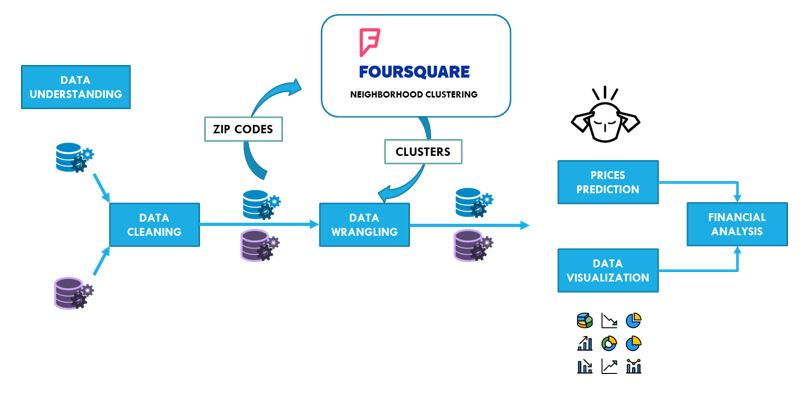

### import libraries and data

In [1]:
import types
import pandas as pd
import numpy as np
from botocore.client import Config
import ibm_boto3

import matplotlib.pyplot as plt
import seaborn as sns

import matplotlib.cm as cm

import matplotlib.colors as colors

!conda install geopandas

import geopandas as gpd

!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab

import folium

from folium.plugins import FastMarkerCluster

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - geopandas


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    poppler-0.65.0             |       h581218d_1         1.6 MB
    libgdal-2.3.3              |       h2e7e64b_0        17.7 MB
    pyproj-1.9.6               |   py36h14380d9_0          76 KB
    fiona-1.8.4                |   py36hc38cc03_0         1.0 MB
    libspatialindex-1.9.3      |       he6710b0_0         3.1 MB
    giflib-5.1.4               |       h14c3975_1          78 KB
    rtree-0.9.4                |           py36_1          48 KB
    freexl-1.0.5               |       h14c3975_0          44 KB
    json-c-0.13.1              |       h1bed415_0          70 KB
    xerces-c-3.2.2             |       h780794e_0         3.2 MB
    proj4-5.2.0                |       he6710b0_1         7.0 MB


In [2]:
# The code was removed by Watson Studio for sharing.

In [3]:
airbnb_df = pd.read_csv(body)
airbnb_df.head()

,id,name,suburb,zipcode,smart_location,latitude,longitude,property_type,room_type,accommodates,...,first_review,last_review,review_scores_rating,cancellation_policy,reviews_per_month,min_night_per_month,min_night_per_year,occupancy_rate,min_income_per_year,min_income_per_month
0,12936,St Kilda 1BR APT+BEACHSIDE+VIEWS+PARKING+WIFI+AC,St Kilda,3182,"St Kilda, Australia",-37.859755,144.977369,Apartment,Entire home/apt,3,...,2010-08-04,2018-11-07,94.0,strict_14_with_grace_period,0.15,0.642857,7.714286,0.023663,1226.571429,102.214286
1,38271,Melbourne - Old Trafford Apartment,Berwick,3806,"Berwick, Australia",-38.057254,145.339356,Apartment,Entire home/apt,5,...,2010-11-24,2018-12-01,97.0,flexible,1.14,1.628571,19.542857,0.059582,1915.200000,159.600000
2,43429,Tranquil Javanese-Style Apartment in Oakleigh ...,Oakleigh East,3166,"Oakleigh East, Australia",-37.899601,145.114475,Apartment,Entire home/apt,2,...,2010-12-05,2018-12-03,97.0,moderate,1.72,4.914286,58.971429,0.190230,5779.200000,481.600000
3,50492,St Kilda Central LUXE 2BR APT+TWO COURTYARDS+WIFI,St Kilda,3182,"St Kilda, Australia",-37.861275,144.980379,Apartment,Entire home/apt,4,...,2012-11-30,2018-12-02,97.0,strict_14_with_grace_period,0.60,2.571429,30.857143,0.097649,5862.857143,488.571429
4,62606,A Room Near the Park,Melbourne,3187,"Melbourne, Australia",-37.928173,145.025176,House,Private room,2,...,2011-03-05,2018-11-29,84.0,moderate,0.22,0.628571,7.542857,0.022997,377.142857,31.428571


In [4]:
print('Number of listings: ', airbnb_df.shape[0])
print('Number of features in dataset: ', airbnb_df.shape[1])
print('Average price at: ${}'.format(round(airbnb_df.price.mean())))
print('Number of suburbs: ',airbnb_df.zipcode.nunique())

Number of listings:  17492
Number of features in dataset:  27
Average price at: $137
Number of suburbs:  236


In [5]:
body = client_b80010563ad347059cff30c3cec0a156.get_object(Bucket='airbnbinvestmentinmelbourneaustra-donotdelete-pr-u7czrdfljykae0',Key='housing_clean.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

housing_df = pd.read_csv(body)
housing_df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-04-02,2.5,3067,...,1,0,156.0,79.0,1900,Yarra City Council,-37.8079,144.9934,Northern Metropolitan,4019
1,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,2017-04-03,2.5,3067,...,2,0,134.0,150.0,1900,Yarra City Council,-37.8093,144.9944,Northern Metropolitan,4019
2,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,2016-04-06,2.5,3067,...,1,2,120.0,142.0,2014,Yarra City Council,-37.8072,144.9941,Northern Metropolitan,4019
3,Abbotsford,124 Yarra St,3,h,1876000.0,S,Nelson,2016-07-05,2.5,3067,...,2,0,245.0,210.0,1910,Yarra City Council,-37.8024,144.9993,Northern Metropolitan,4019
4,Abbotsford,98 Charles St,2,h,1636000.0,S,Nelson,2016-08-10,2.5,3067,...,1,2,256.0,107.0,1890,Yarra City Council,-37.8060,144.9954,Northern Metropolitan,4019


In [6]:
print('Number of houses: ', housing_df.shape[0])
print('Number of features in dataset: ', housing_df.shape[1])
print('Average price at: ${}'.format(round(housing_df.Price.mean())))
print('Number of suburbs: ',housing_df.Postcode.nunique())

Number of houses:  10502
Number of features in dataset:  21
Average price at: $1088148
Number of suburbs:  199


In [7]:

body = client_b80010563ad347059cff30c3cec0a156.get_object(Bucket='airbnbinvestmentinmelbourneaustra-donotdelete-pr-u7czrdfljykae0',Key='airbnb_clustered.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

airbnb_clustered = pd.read_csv(body)
airbnb_clustered.head()


,id,name,suburb,zipcode,smart_location,latitude,longitude,property_type,room_type,accommodates,...,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Latitude,Longitude
0,12936,St Kilda 1BR APT+BEACHSIDE+VIEWS+PARKING+WIFI+AC,St Kilda,3182,"St Kilda, Australia",-37.859755,144.977369,Apartment,Entire home/apt,3,...,Thai Restaurant,Bakery,Australian Restaurant,Ice Cream Shop,Vegetarian / Vegan Restaurant,Japanese Restaurant,Italian Restaurant,Pub,-37.864240,144.981207
1,38271,Melbourne - Old Trafford Apartment,Berwick,3806,"Berwick, Australia",-38.057254,145.339356,Apartment,Entire home/apt,5,...,Italian Restaurant,Pub,Coffee Shop,Road,Park,Shopping Mall,Supermarket,Liquor Store,-38.031442,145.349330
2,43429,Tranquil Javanese-Style Apartment in Oakleigh ...,Oakleigh East,3166,"Oakleigh East, Australia",-37.899601,145.114475,Apartment,Entire home/apt,2,...,BBQ Joint,Asian Restaurant,Zoo Exhibit,Falafel Restaurant,Dumpling Restaurant,Egyptian Restaurant,Electronics Store,Event Space,-37.900410,145.100009
3,50492,St Kilda Central LUXE 2BR APT+TWO COURTYARDS+WIFI,St Kilda,3182,"St Kilda, Australia",-37.861275,144.980379,Apartment,Entire home/apt,4,...,Thai Restaurant,Bakery,Australian Restaurant,Ice Cream Shop,Vegetarian / Vegan Restaurant,Japanese Restaurant,Italian Restaurant,Pub,-37.864240,144.981207
4,62606,A Room Near the Park,Melbourne,3187,"Melbourne, Australia",-37.928173,145.025176,House,Private room,2,...,Light Rail Station,Tanning Salon,Electronics Store,Furniture / Home Store,Grocery Store,Thai Restaurant,Deli / Bodega,Café,-37.916539,145.019440


In [8]:
print('Number of listings: ', airbnb_clustered.shape[0])
print('Number of features in dataset: ', airbnb_clustered.shape[1])
print('Average price at: ${}'.format(round(airbnb_clustered.price.mean())))
print('Number of suburbs: ',airbnb_clustered.zipcode.nunique())

Number of listings:  16967
Number of features in dataset:  41
Average price at: $135
Number of suburbs:  200


In [9]:

body = client_b80010563ad347059cff30c3cec0a156.get_object(Bucket='airbnbinvestmentinmelbourneaustra-donotdelete-pr-u7czrdfljykae0',Key='housing_clustered.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

housing_clustered = pd.read_csv(body)
housing_clustered.head()


,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Latitude,Longitude
0,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-04-02,2.5,3067,...,Thrift / Vintage Store,Farmers Market,Convenience Store,Cultural Center,Coffee Shop,Japanese Restaurant,Vegetarian / Vegan Restaurant,Garden,-37.803703,144.99993
1,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,2017-04-03,2.5,3067,...,Thrift / Vintage Store,Farmers Market,Convenience Store,Cultural Center,Coffee Shop,Japanese Restaurant,Vegetarian / Vegan Restaurant,Garden,-37.803703,144.99993
2,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,2016-04-06,2.5,3067,...,Thrift / Vintage Store,Farmers Market,Convenience Store,Cultural Center,Coffee Shop,Japanese Restaurant,Vegetarian / Vegan Restaurant,Garden,-37.803703,144.99993
3,Abbotsford,124 Yarra St,3,h,1876000.0,S,Nelson,2016-07-05,2.5,3067,...,Thrift / Vintage Store,Farmers Market,Convenience Store,Cultural Center,Coffee Shop,Japanese Restaurant,Vegetarian / Vegan Restaurant,Garden,-37.803703,144.99993
4,Abbotsford,98 Charles St,2,h,1636000.0,S,Nelson,2016-08-10,2.5,3067,...,Thrift / Vintage Store,Farmers Market,Convenience Store,Cultural Center,Coffee Shop,Japanese Restaurant,Vegetarian / Vegan Restaurant,Garden,-37.803703,144.99993


In [10]:
print('Number of listings: ', housing_clustered.shape[0])
print('Number of features in dataset: ', housing_clustered.shape[1])
print('Average price at: ${}'.format(round(housing_clustered.Price.mean())))
print('Number of suburbs: ',housing_clustered.Postcode.nunique())

Number of listings:  9905
Number of features in dataset:  35
Average price at: $1102367
Number of suburbs:  171


## Airbnb data visualization <a name="airbnb"></a>

In this section, we will produce the different charts to have valuable insight on Melbourne Airbnb market.

#### Room type

In [11]:
room_type_count = airbnb_df['room_type'].value_counts()

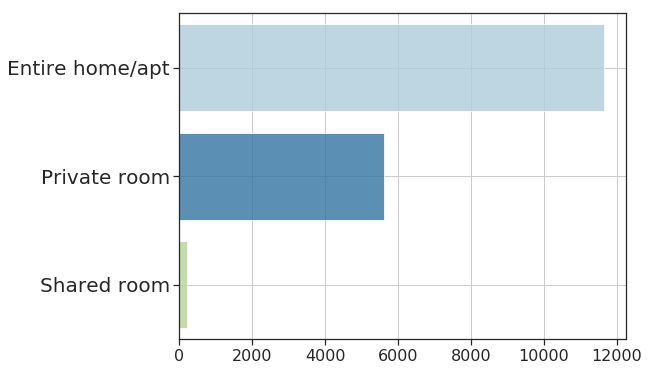

In [12]:
sns.set(style="ticks")

plt.figure(figsize=(8,6))
sns.barplot( room_type_count.values, room_type_count.index, alpha=0.8, palette="Paired")
#plt.title('Room type')
#plt.xlabel('Listings', fontsize=12)
plt.tick_params(axis='y', labelsize=20)
plt.tick_params(axis='x', labelsize=16)
plt.grid()
plt.show()

In [13]:
room_type_count

Entire home/apt    11657
Private room        5620
Shared room          215
Name: room_type, dtype: int64

In [14]:
airbnb_df['price'].describe()

count    17492.000000
mean       136.887091
std        106.254111
min         12.000000
25%         71.000000
50%        114.000000
75%        161.000000
max        999.000000
Name: price, dtype: float64

#### Rental size

Let us show the number of bedrooms distribution in our dataset.

In [15]:
bedrooms_type_count = airbnb_df['bedrooms'].value_counts()

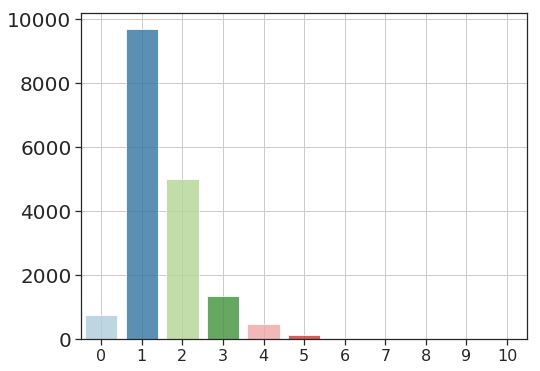

In [16]:
sns.set(style="ticks")

plt.figure(figsize=(8,6))
sns.barplot(  bedrooms_type_count.index, bedrooms_type_count.values, alpha=0.8, palette="Paired")
#plt.title('Room type')
#plt.xlabel('Listings', fontsize=12)
plt.tick_params(axis='y', labelsize=20)
plt.tick_params(axis='x', labelsize=16)
plt.grid()
plt.show()

In [17]:
bedrooms_type_count

1     9700
2     5015
3     1352
0      761
4      482
5      123
6       38
7       15
10       2
9        2
8        2
Name: bedrooms, dtype: int64

In [18]:
airbnb_df['bedrooms'].describe()

count    17492.000000
mean         1.527327
std          0.910617
min          0.000000
25%          1.000000
50%          1.000000
75%          2.000000
max         10.000000
Name: bedrooms, dtype: float64

Let us now show the number of guests allowed distribution in our dataset.

In [19]:
accommodates_type_count = airbnb_df['accommodates'].value_counts()

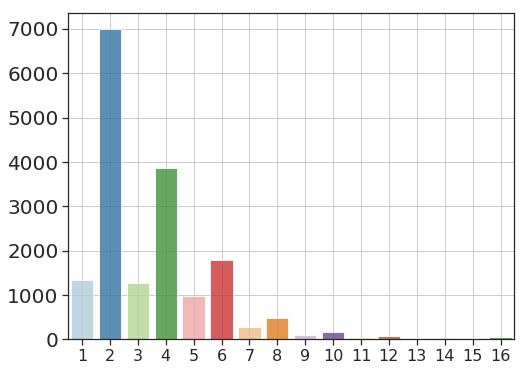

In [20]:
sns.set(style="ticks")

plt.figure(figsize=(8,6))
sns.barplot(  accommodates_type_count.index, accommodates_type_count.values, alpha=0.8, palette="Paired")
plt.tick_params(axis='y', labelsize=20)
plt.tick_params(axis='x', labelsize=16)
plt.grid()
plt.show()

It seems that there is an important category not clearly shown in the chart, which is **4+** accomodates. Let's adapt the chart with a **4+** category.

In [21]:
accommodates = airbnb_df

accommodates['acc_plot'] = [np.nan for i in range(len(accommodates.index))]

accommodates.loc[accommodates.accommodates >= 4 , 'acc_plot'] = '4+'

accommodates.loc[accommodates.accommodates < 4 , 'acc_plot'] = accommodates.accommodates

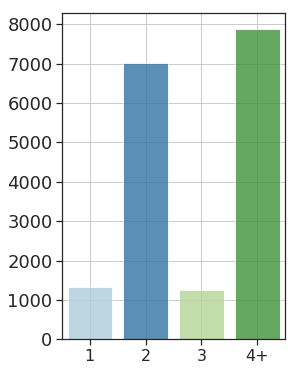

In [22]:
sns.set(style="ticks")

accommodates_type_count = accommodates['acc_plot'].value_counts()

plt.figure(figsize=(4,6))
sns.barplot(  accommodates_type_count.index, accommodates_type_count.values, alpha=0.8, palette="Paired", order=[1,2,3,'4+'])

plt.tick_params(axis='y', labelsize=18)
plt.tick_params(axis='x', labelsize=16)
plt.grid()
plt.show()

In [23]:
accommodates_type_count

4+    7885
2     7006
1     1337
3     1264
Name: acc_plot, dtype: int64

In [24]:
airbnb_df['accommodates'].describe()

count    17492.000000
mean         3.519666
std          2.194898
min          1.000000
25%          2.000000
50%          3.000000
75%          4.000000
max         16.000000
Name: accommodates, dtype: float64

#### Activity

In this section, our goal is to get insight regarding the overall rental acctivity.

We get to separate set of values, form the full dataset and from the high frequency dataset. (occupied over **90** nights per year)


We got the info below, from the following tables :

**Full dataset**
* average price per night : **136.9**
* average minimum nights per year : **46.2**
* average minimum occupancy : **22.3%**
* average minimum estimated income per month : **526.76**
* average reviews per listing / month : **1.59**
* total number of reviews : **484006**

**high frequency dataset**
* average price per night : **137.5**
* average minimum nights per year : **133.56**
* average minimum occupancy : **46.7%**
* average minimum estimated income per month : **1526.99**
* average reviews per listing / month : **4.05**
* total number of reviews : **201901**



In [25]:
airbnb_df[airbnb_df['min_night_per_year'] > 90].describe()

,id,zipcode,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,availability_365,number_of_reviews,review_scores_rating,reviews_per_month,min_night_per_month,min_night_per_year,occupancy_rate,min_income_per_year,min_income_per_month
count,2.840000e+03,2840.000000,2840.000000,2840.000000,2840.000000,2840.000000,2840.000000,2840.000000,2840.000000,2840.000000,2840.000000,2840.000000,2840.000000,2840.000000,2840.000000,2840.000000,2840.000000,2840.000000,2840.000000
mean,1.880866e+07,3089.501761,-37.819117,144.995537,3.955986,1.241549,1.561620,2.202465,137.516549,2.455634,309.400352,71.091901,95.768662,4.050568,11.129888,133.558653,0.467187,18359.444306,1526.994670
std,7.932004e+06,152.655651,0.050187,0.119098,2.194288,0.504400,0.897968,1.533997,79.537743,1.541079,79.624439,67.511905,4.454419,2.050583,3.352819,40.233828,0.185718,12253.159257,1015.203942
min,4.183600e+04,3000.000000,-38.169754,144.557500,1.000000,0.000000,0.000000,1.000000,14.000000,1.000000,92.000000,1.000000,20.000000,0.560000,7.500000,90.000000,0.247045,1336.800000,111.400000
25%,1.361465e+07,3003.000000,-37.833873,144.955915,2.000000,1.000000,1.000000,1.000000,93.000000,2.000000,273.000000,19.000000,94.000000,2.710000,8.571429,102.857143,0.320313,10999.328571,915.685714
50%,2.057363e+07,3051.000000,-37.815999,144.967404,4.000000,1.000000,1.000000,2.000000,120.000000,2.000000,365.000000,52.000000,97.000000,3.520000,10.135714,121.628571,0.408432,15562.285714,1296.571429
75%,2.519407e+07,3141.000000,-37.806204,144.990818,5.000000,1.000000,2.000000,3.000000,161.000000,3.000000,365.000000,103.000000,98.000000,5.420000,12.664286,151.971429,0.569292,21645.514286,1803.450000
max,3.049052e+07,3977.000000,-37.486284,145.760250,16.000000,7.000000,7.000000,15.000000,999.000000,10.000000,365.000000,538.000000,100.000000,14.540000,29.700000,356.400000,0.999392,145530.000000,12127.500000


In [26]:
airbnb_df.describe()

,id,zipcode,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,availability_365,number_of_reviews,review_scores_rating,reviews_per_month,min_night_per_month,min_night_per_year,occupancy_rate,min_income_per_year,min_income_per_month
count,1.749200e+04,17492.000000,17492.000000,17492.000000,17492.000000,17492.000000,17492.000000,17492.000000,17492.000000,17492.000000,17492.000000,17492.000000,17492.000000,17492.000000,17492.000000,17492.000000,17492.000000,17492.000000,17492.000000
mean,1.771645e+07,3114.944375,-37.825612,145.008702,3.519666,1.232106,1.527327,2.027155,136.887091,2.127087,270.740567,27.670135,94.255660,1.593622,3.850335,46.204018,0.223188,6338.555150,526.767374
std,7.871652e+06,264.639852,0.065365,0.129127,2.194898,0.513365,0.910617,1.511341,106.254111,1.491126,115.957131,42.515945,8.452414,1.722104,3.955892,47.470704,0.228944,8594.742815,706.870352
min,9.835000e+03,2010.000000,-38.224427,144.531993,1.000000,0.000000,0.000000,1.000000,12.000000,1.000000,3.000000,1.000000,20.000000,0.010000,0.028571,0.342857,0.000939,7.200000,0.600000
25%,1.187326e+07,3006.000000,-37.849747,144.957247,2.000000,1.000000,1.000000,1.000000,71.000000,1.000000,162.000000,3.000000,93.000000,0.310000,0.857143,10.285714,0.040661,1002.428571,83.535714
50%,1.908679e+07,3067.000000,-37.816785,144.977242,3.000000,1.000000,1.000000,2.000000,114.000000,2.000000,338.000000,11.000000,97.000000,1.000000,2.500000,30.000000,0.144412,3290.400000,274.200000
75%,2.361826e+07,3161.000000,-37.803197,145.007922,4.000000,1.000000,2.000000,2.000000,161.000000,2.000000,365.000000,33.000000,100.000000,2.300000,5.714286,68.571429,0.331643,8514.514286,709.464286
max,3.054094e+07,30122.000000,-37.486284,145.831408,16.000000,8.000000,10.000000,20.000000,999.000000,10.000000,365.000000,538.000000,100.000000,14.540000,29.700000,356.400000,0.999392,145530.000000,12127.500000


In [27]:
airbnb_df['number_of_reviews'].sum(axis = 0, skipna = True) 

484006

In [28]:
airbnb_df[airbnb_df['min_night_per_year'] > 90].sum(axis = 0, skipna = True)

id                                                            53416602993
name                    Fabulous Fitzroy, gorgeous Gertrude St.   No I...
suburb                  FitzroyCollingwoodFitzroyKooyongSouthbankSouth...
zipcode                                                           8774185
smart_location          Fitzroy, AustraliaCollingwood, AustraliaFitzro...
latitude                                                          -107406
longitude                                                          411787
property_type           HouseApartmentHouseGuesthouseApartmentApartmen...
room_type               Private roomEntire home/aptEntire home/aptEnti...
accommodates                                                        11235
bathrooms                                                            3526
bedrooms                                                             4435
beds                                                                 6255
price                                 

#### Availability 

We use a high availability metric and filter of 160 days per year (3 days a week)

* listings with high availability : **13309**
* listings with low availability : **4183**

* average availabilty : **270 days**

#### Most poupalar neighborhood & other mapping

Let's now do some mapping to understand the market.

We are working with the clustered dataset produced in the **clustering** section.

In order to have values more representative of our investment, we focus only on **high frequency** listings. We hope to invest on a highly frequented rental.

Let's now classify the neighborhood based on the average of the most meaningful features using **nlargest** method.

**Top 5 : reviews_per_month**

In [29]:
df = airbnb_clustered[airbnb_clustered['min_night_per_year']>=90].groupby("Neighborhood")
df = df[['Neighborhood','price', 'reviews_per_month', 'min_income_per_year', 'occupancy_rate','latitude','longitude']]

# with these line of code, we add to the dataframe the number of listings in the group
counts = df.size().to_frame(name='counts')
df = counts.join(df.mean()).reset_index()
#df = df[df['counts']>=10]

df.nlargest(5, 'reviews_per_month')

,Neighborhood,counts,price,reviews_per_month,min_income_per_year,occupancy_rate,latitude,longitude
121,Smiths Gully,1,180.000000,11.170000,34467.428571,0.660296,-37.625882,145.295839
143,"Westmeadows, Attwood",6,58.666667,11.068333,11517.571429,0.593357,-37.678517,144.878664
53,"Gladstone Park, Tullamarine, Gowanbrae",8,48.875000,9.291250,8450.764286,0.546163,-37.698550,144.877918
20,"Broadmeadows, Jacana, Dallas",2,47.500000,7.375000,6085.714286,0.346380,-37.684765,144.915315
66,"Keilor Downs, Keilor Lodge",1,69.000000,7.200000,8516.571429,0.979592,-37.722958,144.810752


**Top 5 : min_income_per_year**

In [30]:
df = airbnb_clustered[airbnb_clustered['min_night_per_year']>=90].groupby("Neighborhood")
df = df[['Neighborhood', 'price','reviews_per_month', 'min_income_per_year', 'occupancy_rate','latitude','longitude']]
counts = df.size().to_frame(name='counts')
df = counts.join(df.mean()).reset_index()
#df = df[df['counts']>=10]
df.nlargest(5, 'min_income_per_year')

,Neighborhood,counts,price,reviews_per_month,min_income_per_year,occupancy_rate,latitude,longitude
74,"Kooyong, Malvern",4,261.500000,2.170000,44874.900000,0.502178,-37.851679,145.034647
121,Smiths Gully,1,180.000000,11.170000,34467.428571,0.660296,-37.625882,145.295839
147,"Yarra Glen, Christmas Hills, Dixons Creek, Ste...",2,258.000000,5.355000,33863.400000,0.571347,-37.655974,145.383632
57,"Hampton East, Hampton",3,275.333333,2.883333,31900.685714,0.466833,-37.938201,145.021927
79,"Manningham, Templestowe Lower",3,251.666667,2.950000,31220.000000,0.452164,-37.774384,145.118400


**Top 5 : occupancy_rate**

In [31]:
df = airbnb_clustered[airbnb_clustered['min_night_per_year']>=90].groupby("Neighborhood")
df = df[['Neighborhood', 'reviews_per_month', 'min_income_per_year', 'occupancy_rate','latitude','longitude']]
counts = df.size().to_frame(name='counts')
df = counts.join(df.mean()).reset_index()
df = df[df['counts']>=10]

df.nlargest(5, 'occupancy_rate')

,Neighborhood,counts,reviews_per_month,min_income_per_year,occupancy_rate,latitude,longitude
58,"Hawthorn East, Melbourne",10,4.003000,18382.268571,0.540482,-37.829690,145.049040
140,"Warburton, Millgrove, Big Pats Creek, McMahons...",21,4.746667,21202.497959,0.523833,-37.753362,145.697547
39,"Collingwood, Collingwood, Melbourne, FITZROY",44,3.817727,20048.664935,0.517262,-37.803388,144.986145
0,"Abbotsford, Abbotsford, Melbourne",29,3.381379,18086.051232,0.516262,-37.807895,145.003385
146,"Windsor, Prahran, Praharan, Melbourne, Prahran...",36,3.691944,15444.157143,0.511806,-37.851809,144.995132


**Top 5 : number of listings**

In [32]:
df = airbnb_clustered[airbnb_clustered['min_night_per_year']>=90].groupby("Neighborhood")
df = df[['Neighborhood', 'price','reviews_per_month', 'min_income_per_year', 'occupancy_rate','latitude','longitude']]
counts = df.size().to_frame(name='counts')
df = counts.join(df.mean()).reset_index()

df.nlargest(6, 'counts')

,Neighborhood,counts,price,reviews_per_month,min_income_per_year,occupancy_rate,latitude,longitude
88,"Melbourne, 墨爾本 Melbourne, Melbourne City, Melb...",665,145.950376,4.786602,19647.483996,0.476549,-37.813826,144.959863
125,"Southbank, Melbourne, Southbank, Melbourne, So...",272,162.683824,4.171434,22424.843067,0.475328,-37.825602,144.962798
128,"St Kilda, St Kilda West, Melbourne, Saint Kild...",178,128.073034,3.525674,16288.227929,0.459723,-37.863337,144.980030
124,"South Yarra, Melbourne, South Yarra, Victoria, AU",123,127.756098,3.258130,16919.962369,0.451269,-37.839572,144.993328
87,"Melbourne, St Kilda, Saint Kilda, South Melbou...",118,147.186441,4.604915,19703.956416,0.472882,-37.824158,144.966335
43,"Docklands, Melbourne, VIC, Dockland, Southbank",97,162.288660,5.352784,23782.607364,0.473120,-37.818265,144.943890


Now let us map these findings. The goal is to show for each dataframe, the five listings, as colored polygons that are the associated suburb boundaries.

Doing so, we will have a comprehensive understanding of where to invest.

At this stage of our study, data is still missing...

Indeed, we need a dataframe containing suburb boundaries. 

I found in the following source, a table of Victoria boundaries is **GeoJson** format, prepared by [Stephen Muss](https://github.com/stephenmuss)
. 

The **GeoJSON** format is an open standard format base on JSON designed for representing simple geographical features, along with their non-spatial attributes. 

The features include points (therefore addresses and locations), line strings (therefore streets, highways and boundaries), **polygons** (countries, provinces, tracts of land), and multi-part collections of these types. 


We will use **GeoPandas** library to generate a usable dataframe containing the different geometries. 

**GeoPandas** extends the datatypes used by **pandas** to allow spatial operations on geometric types. Geometric operations are performed by **shapely**. 

We import and convert the file from our repositery using **GeoPandas** :

In [33]:
# Your data file was loaded into a botocore.response.StreamingBody object.
# Please read the documentation of ibm_boto3 and pandas to learn more about the possibilities to load the data.
# ibm_boto3 documentation: https://ibm.github.io/ibm-cos-sdk-python/
# pandas documentation: http://pandas.pydata.org/
streaming_body_4 = client_b80010563ad347059cff30c3cec0a156.get_object(Bucket='airbnbinvestmentinmelbourneaustra-donotdelete-pr-u7czrdfljykae0', Key='victoria.geojson')['Body']
# add missing __iter__ method so pandas accepts body as file-like object
if not hasattr(streaming_body_4, "__iter__"): streaming_body_4.__iter__ = types.MethodType( __iter__, streaming_body_4 ) 

In [34]:
nbh_geo = gpd.read_file(streaming_body_4)

We keep only relevant data from the GeoJSON : the **suburb_name** and the **geometry** :

In [35]:
nbh_geo = nbh_geo[["Suburb_Name","geometry"]]

We rename the suburb coulumn name and convert it to upper case.

In [36]:
nbh_geo.rename(columns={'Suburb_Name':'suburb'}, inplace=True)

nbh_geo['suburb'] = nbh_geo['suburb'].str.upper() 

nbh_geo.head()

,suburb,geometry
0,ABBOTSFORD,"POLYGON ((145.00129 -37.79560, 145.00195 -37.7..."
1,ABERFELDIE,"POLYGON ((144.88948 -37.75393, 144.90732 -37.7..."
2,ACHERON,"POLYGON ((145.64165 -37.31344, 145.63799 -37.2..."
3,AIREYS INLET,"POLYGON ((144.10217 -38.46123, 144.10247 -38.4..."
4,AIRPORT WEST,"POLYGON ((144.88941 -37.73451, 144.88325 -37.7..."


The boundaries look like this :

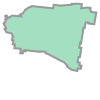

In [37]:
nbh_geo['geometry'][18]

Now that we have the boundaries data, we need to associate a geometry to a neighborhood in our **top 5** dataframe.

We notice that for each row, we have a **latitude** and **longitude** value, which is the average of all concatenated listings.

We build a function that will associate a **polygon** to a suburb/neighborhood based on a loop verifying wether the **point** located by **latitude** and **longitude** values is within the **polygon**. The output will be **GeoDataFrame**.

In [38]:
from shapely.geometry import Point, shape

In [39]:
# inputs are the suburb names column from our top 5, the Geodataframe, the latitude and longitude columns from the top 5.

def getSuburbPolygon(names, geo, latitudes, longitudes) :

    df_list = []
    
    geo_list = []
    
    rows = geo.shape[0]
    
# Coordinate Reference Systems, "epsg:4326" is a common projection of WGS84 Latitude/Longitude
    
    crs = {'init': 'epsg:4326'}
    
    for name, lat, lng in zip(names, latitudes, longitudes):

# using shapely, we create a point object in each iteration with (X,Y) = (longitude, latitude)

        p = Point( lng , lat )
        
        ind = 0

# we use within() method that produces a True value if point p is within the selected geometry

        while ind < rows and not p.within(geo['geometry'][ind]) :
            
            ind+=1
            
        df_list.append([
            name, 
            lat, 
            lng, geo['suburb'][ind]])
        
        if ind == rows :
            geo_list.append(np.nan)
            print(np.nan)
        
        else: 
            geo_list.append(geo['geometry'][ind])
            print(name,' / ', geo['suburb'][ind])
              
            
    subpolydf = pd.DataFrame(df_list, columns =['suburb', 'latitude', 'longitude', 'suburb_geo'] )

# we generate the GeoDataFrame using GeoPandas from the former dataframe, and the list of geometries

    subpoly_geo = gpd.GeoDataFrame(subpolydf, crs = crs,  geometry = geo_list)
                            
    
    return(subpoly_geo)


Let us test our new function on the dataframe below :

In [40]:
df = airbnb_clustered[airbnb_clustered['min_night_per_year']>=90].groupby("Neighborhood")
df = df[['Neighborhood', 'reviews_per_month', 'min_income_per_year', 'occupancy_rate','latitude','longitude']]
counts = df.size().to_frame(name='counts')
df = counts.join(df.mean()).reset_index()

In [41]:
df = df.nlargest(5, 'counts')

In [42]:
test = getSuburbPolygon(names = df['Neighborhood'], geo = nbh_geo, latitudes = df.latitude, longitudes = df.longitude)

test.head()

Melbourne, 墨爾本 Melbourne, Melbourne City, Melbourne Victoria, Victoria, Docklands, Melborne, melbourne, Melbourne CBD  /  MELBOURNE
Southbank, Melbourne, Southbank, Melbourne, Southbank Melbourne, South Wharf, Collingwood, South Melbourne, Southbank, Victoria, AU, Docklands  /  SOUTHBANK
St Kilda, St Kilda West, Melbourne, Saint Kilda, Saint Kilda West, St Kilda West Melbourne, St. Kilda West, Port Phillip City, St. Kilda, st kilda, Saint Kilda, Victoria, AU  /  ST KILDA 
South Yarra, Melbourne, South Yarra, Victoria, AU  /  SOUTH YARRA
Melbourne, St Kilda, Saint Kilda, South Melbourne, South Yarra  /  SOUTHBANK


,suburb,latitude,longitude,suburb_geo,geometry
0,"Melbourne, 墨爾本 Melbourne, Melbourne City, Melb...",-37.813826,144.959863,MELBOURNE,"MULTIPOLYGON (((144.97793 -37.81814, 144.98175..."
1,"Southbank, Melbourne, Southbank, Melbourne, So...",-37.825602,144.962798,SOUTHBANK,"POLYGON ((144.95599 -37.82305, 144.96138 -37.8..."
2,"St Kilda, St Kilda West, Melbourne, Saint Kild...",-37.863337,144.980030,ST KILDA,"POLYGON ((144.97112 -37.86334, 144.97269 -37.8..."
3,"South Yarra, Melbourne, South Yarra, Victoria, AU",-37.839572,144.993328,SOUTH YARRA,"POLYGON ((145.00319 -37.84810, 144.98502 -37.8..."
4,"Melbourne, St Kilda, Saint Kilda, South Melbou...",-37.824158,144.966335,SOUTHBANK,"POLYGON ((144.95599 -37.82305, 144.96138 -37.8..."


We now map the result :

In [43]:
# Melbourne location to center the map

Mlatitude = -37.8142176

Mlongitude = 144.9631608

In [44]:
from branca.colormap import linear

In [45]:
map_df = airbnb_clustered[airbnb_clustered['min_night_per_year']>=90].groupby("Neighborhood")
map_df = map_df[['Neighborhood', 'reviews_per_month', 'min_income_per_year', 'occupancy_rate','latitude','longitude']]
counts = map_df.size().to_frame(name='counts')
map_df = counts.join(map_df.mean()).reset_index()

map_df = map_df[map_df['counts']>=10]

map_df = map_df.nlargest(5, 'counts')

map_df.reset_index(inplace=True)

geo_df = getSuburbPolygon(names = map_df['Neighborhood'], geo = nbh_geo, latitudes = map_df.latitude, longitudes = map_df.longitude)

latitude = map_df['latitude'].mean()

longitude = map_df['longitude'].mean()

Melbourne, 墨爾本 Melbourne, Melbourne City, Melbourne Victoria, Victoria, Docklands, Melborne, melbourne, Melbourne CBD  /  MELBOURNE
Southbank, Melbourne, Southbank, Melbourne, Southbank Melbourne, South Wharf, Collingwood, South Melbourne, Southbank, Victoria, AU, Docklands  /  SOUTHBANK
St Kilda, St Kilda West, Melbourne, Saint Kilda, Saint Kilda West, St Kilda West Melbourne, St. Kilda West, Port Phillip City, St. Kilda, st kilda, Saint Kilda, Victoria, AU  /  ST KILDA 
South Yarra, Melbourne, South Yarra, Victoria, AU  /  SOUTH YARRA
Melbourne, St Kilda, Saint Kilda, South Melbourne, South Yarra  /  SOUTHBANK


In [46]:
#nbh_count_colormap = linear.YlGnBu_09.scale(min(map_df['min_income_per_year']), max(map_df['min_income_per_year']))

nbh_locs_map = folium.Map(location=[latitude, longitude], zoom_start = 13)

style_function = lambda x: {
    'fillColor': '#F4FF61',
    'color': 'black',
    'weight': 1.5,
    'fillOpacity': 0.5
}

folium.GeoJson(geo_df, style_function = style_function ).add_to(nbh_locs_map)

#nbh_count_colormap.add_to(nbh_locs_map)
#nbh_count_colormap.caption = 'Reviews per montht'
#nbh_count_colormap.add_to(nbh_locs_map)

nbh_locs_map

In [47]:
geo_df

,suburb,latitude,longitude,suburb_geo,geometry
0,"Melbourne, 墨爾本 Melbourne, Melbourne City, Melb...",-37.813826,144.959863,MELBOURNE,"MULTIPOLYGON (((144.97793 -37.81814, 144.98175..."
1,"Southbank, Melbourne, Southbank, Melbourne, So...",-37.825602,144.962798,SOUTHBANK,"POLYGON ((144.95599 -37.82305, 144.96138 -37.8..."
2,"St Kilda, St Kilda West, Melbourne, Saint Kild...",-37.863337,144.980030,ST KILDA,"POLYGON ((144.97112 -37.86334, 144.97269 -37.8..."
3,"South Yarra, Melbourne, South Yarra, Victoria, AU",-37.839572,144.993328,SOUTH YARRA,"POLYGON ((145.00319 -37.84810, 144.98502 -37.8..."
4,"Melbourne, St Kilda, Saint Kilda, South Melbou...",-37.824158,144.966335,SOUTHBANK,"POLYGON ((144.95599 -37.82305, 144.96138 -37.8..."


In [48]:
locs_geometry = [Point(xy) for xy in zip(airbnb_df.longitude,
                                         airbnb_df.latitude)]
crs = {'init': 'epsg:4326'}
# Coordinate Reference Systems, "epsg:4326" is a common projection of WGS84 Latitude/Longitude
locs_gdf = gpd.GeoDataFrame(airbnb_df, crs=crs, geometry=locs_geometry)

In [49]:
locs_map = folium.Map(location=[latitude, longitude], zoom_start=13, tiles='cartodbpositron')

feature_ea = folium.FeatureGroup(name='Entire home/apt')
feature_pr = folium.FeatureGroup(name='Private room')
feature_sr = folium.FeatureGroup(name='Shared room')

for i, v in locs_gdf.iterrows():
    #popup = """
    #Location id : <b>%s</b><br>
    #Room type : <b>%s</b><br>
    #Neighbourhood : <b>%s</b><br>
    #Price : <b>%d</b><br>
    #""" % (v['id'], v['room_type'], v['suburb'], v['price'])
    
    if v['room_type'] == 'Entire home/apt':
        folium.CircleMarker(location=[v['latitude'], v['longitude']],
                            radius=3,
                            #tooltip=popup,
                            color='#FFBA00',
                            weight=0,
                            fill=True,
                            fill_color='#FFBA00',
                            fill_opacity=0.3).add_to(feature_ea)
    elif v['room_type'] == 'Private room':
        folium.CircleMarker(location=[v['latitude'], v['longitude']],
                            radius=3,
                            #tooltip=popup,
                            color='#087FBF',
                            weight=0,
                            fill=True,
                            fill_color='#087FBF',
                            fill_opacity=0.3).add_to(feature_pr)
    elif v['room_type'] == 'Shared room':
        folium.CircleMarker(location=[v['latitude'], v['longitude']],
                            radius=3,
                            #tooltip=popup,
                            color='#FF0700',
                            weight=0,
                            fill=True,
                            fill_color='#FF0700',
                            fill_opacity=0.3).add_to(feature_sr)

feature_ea.add_to(locs_map)
feature_pr.add_to(locs_map)
feature_sr.add_to(locs_map)
folium.LayerControl(collapsed=False).add_to(locs_map)

In [50]:
locs_map

## Housing data visualization <a name="housing"></a>

In this section, we will produce the different charts to have valuable insight on Melbourne Housing market.

#### House type

In [51]:
house_type_count = housing_df['Type'].value_counts()

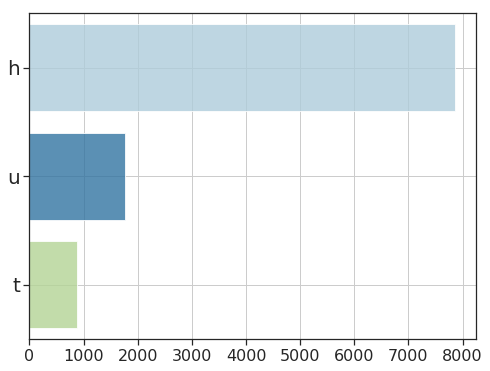

In [52]:
sns.set(style="ticks")

plt.figure(figsize=(8,6))
sns.barplot( house_type_count.values, house_type_count.index, alpha=0.8, palette="Paired")
#plt.title('Room type')
#plt.xlabel('Listings', fontsize=12)
plt.tick_params(axis='y', labelsize=20)
plt.tick_params(axis='x', labelsize=16)
plt.grid()
plt.show()

In [53]:
house_type_count

h    7852
u    1770
t     880
Name: Type, dtype: int64

In [54]:
house_type = housing_df.groupby(["Type"]).mean()

In [55]:
house_type

,Rooms,Price,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Propertycount
Type,,,,,,,,,,,,,
h,3.388818,1.219855e+06,12.442015,3118.866531,3.367550,1.742868,1.859272,484.320173,169.534891,1959.882323,-37.799914,144.990807,7317.176516
t,2.885227,9.135301e+05,10.385227,3101.564773,2.863636,1.847727,1.581818,233.206818,141.745202,1999.075000,-37.814908,144.995900,7211.967045
u,1.971186,5.906918e+05,7.793220,3107.583616,1.965537,1.191525,1.138418,382.023729,81.443277,1979.619774,-37.822079,144.993271,8285.831638


#### Rooms

In [56]:
rooms_count = housing_df['Rooms'].value_counts()

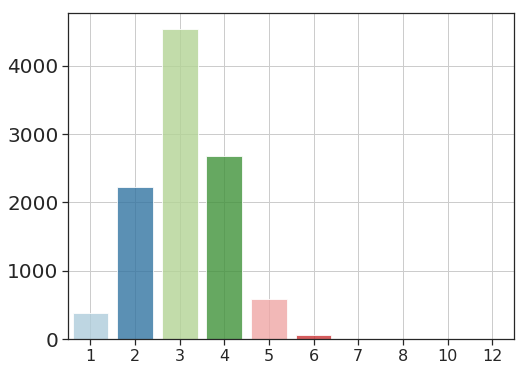

In [57]:
sns.set(style="ticks")

plt.figure(figsize=(8,6))
sns.barplot(  rooms_count.index, rooms_count.values, alpha=0.8, palette="Paired")
#plt.title('Room type')
#plt.xlabel('Listings', fontsize=12)
plt.tick_params(axis='y', labelsize=20)
plt.tick_params(axis='x', labelsize=16)
plt.grid()
plt.show()

In [58]:
rooms_count

3     4539
4     2681
2     2219
5      595
1      391
6       60
7       10
8        5
12       1
10       1
Name: Rooms, dtype: int64

#### Bedrooms

In [59]:
bedrooms_count = housing_df['Bedroom2'].value_counts()

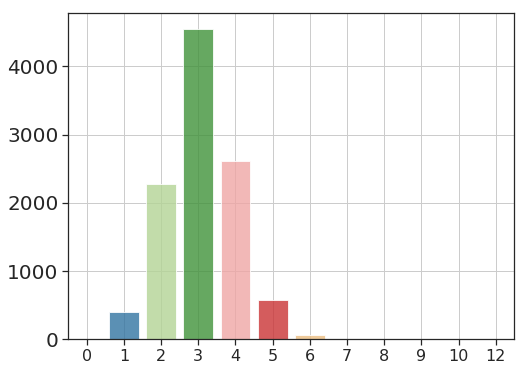

In [60]:
sns.set(style="ticks")

plt.figure(figsize=(8,6))
sns.barplot(  bedrooms_count.index, bedrooms_count.values, alpha=0.8, palette="Paired")
#plt.title('Room type')
#plt.xlabel('Listings', fontsize=12)
plt.tick_params(axis='y', labelsize=20)
plt.tick_params(axis='x', labelsize=16)
plt.grid()
plt.show()

In [61]:
bedrooms_count

3     4554
4     2616
2     2276
5      576
1      400
6       59
7        8
0        5
9        3
8        3
12       1
10       1
Name: Bedroom2, dtype: int64

#### Bathroom

In [62]:
bathroom_count = housing_df['Bathroom'].value_counts()

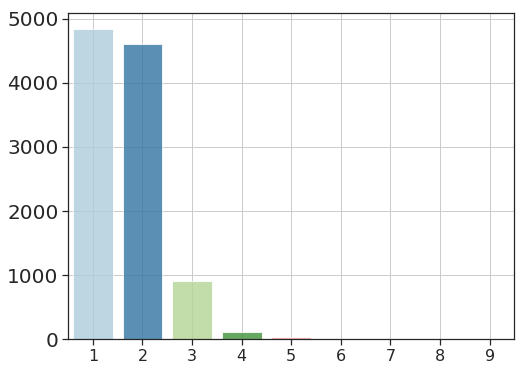

In [63]:
sns.set(style="ticks")

plt.figure(figsize=(8,6))
sns.barplot(  bathroom_count.index, bathroom_count.values, alpha=0.8, palette="Paired")
#plt.title('Room type')
#plt.xlabel('Listings', fontsize=12)
plt.tick_params(axis='y', labelsize=20)
plt.tick_params(axis='x', labelsize=16)
plt.grid()
plt.show()

In [64]:
bathroom_count

1    4844
2    4601
3     907
4     112
5      29
6       6
7       1
9       1
8       1
Name: Bathroom, dtype: int64

In [65]:
bath = housing_df

bath['bath_plot'] = [np.nan for i in range(len(bath.index))]

bath.loc[bath.Bathroom >= 4 , 'bath_plot'] = '4+'

bath.loc[bath.Bathroom < 4 , 'bath_plot'] = bath.Bathroom

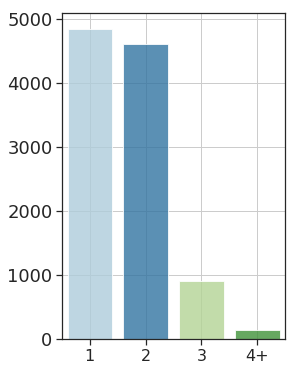

In [66]:
sns.set(style="ticks")

bath_count = bath['bath_plot'].value_counts()

plt.figure(figsize=(4,6))
sns.barplot(  bath_count.index, bath_count.values, alpha=0.8, palette="Paired", order=[1,2,3,'4+'])

plt.tick_params(axis='y', labelsize=18)
plt.tick_params(axis='x', labelsize=16)
plt.grid()
plt.show()

In [67]:
bath_count

1     4844
2     4601
3      907
4+     150
Name: bath_plot, dtype: int64

#### Building Area

In [68]:
area = housing_df['BuildingArea']

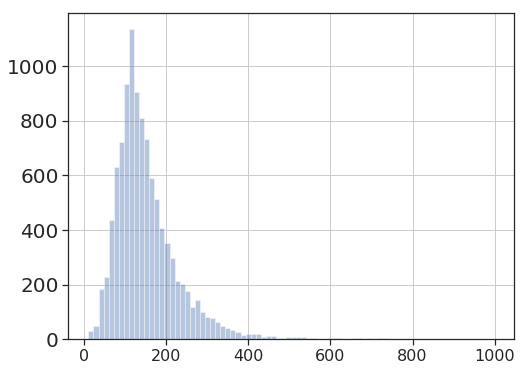

In [69]:
sns.set(style="ticks")

plt.figure(figsize=(8,6))
#sns.barplot(  area_count.index, area_count.values, alpha=0.8, palette="Paired")
sns.distplot(area.values, bins=80, kde=False)

#plt.title('Room type')
#plt.xlabel('Listings', fontsize=12)
plt.tick_params(axis='y', labelsize=20)
plt.tick_params(axis='x', labelsize=16)
plt.grid()
plt.show()

#### Car

In [70]:
car_count = housing_df['Car'].value_counts()

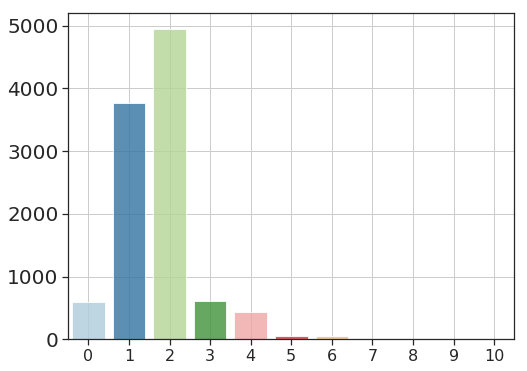

In [71]:
sns.set(style="ticks")

plt.figure(figsize=(8,6))
sns.barplot(  car_count.index, car_count.values, alpha=0.8, palette="Paired")
#plt.title('Room type')
#plt.xlabel('Listings', fontsize=12)
plt.tick_params(axis='y', labelsize=20)
plt.tick_params(axis='x', labelsize=16)
plt.grid()
plt.show()

In [72]:
car = housing_df

car['bath_plot'] = [np.nan for i in range(len(car.index))]

car.loc[car.Car >= 3 , 'car_plot'] = '3+'

car.loc[car.Car < 3 , 'car_plot'] = car.Car

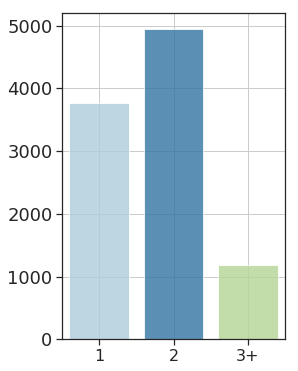

In [73]:
sns.set(style="ticks")

car_count = car['car_plot'].value_counts()

plt.figure(figsize=(4,6))
sns.barplot(  car_count.index, car_count.values, alpha=0.8, palette="Paired", order=[1,2,'3+'])

plt.tick_params(axis='y', labelsize=18)
plt.tick_params(axis='x', labelsize=16)
plt.grid()
plt.show()

In [74]:
car_count

2     4953
1     3770
3+    1177
0      602
Name: car_plot, dtype: int64

#### Year built

In [75]:
year = housing_df['YearBuilt']

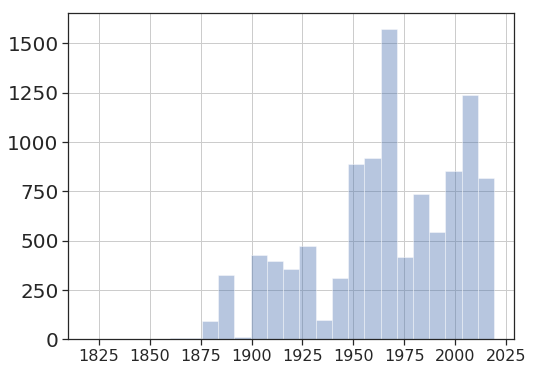

In [76]:
sns.set(style="ticks")

plt.figure(figsize=(8,6))
sns.distplot(year.values, bins=25, kde=False)

#plt.title('Room type')
#plt.xlabel('Listings', fontsize=12)
plt.tick_params(axis='y', labelsize=20)
plt.tick_params(axis='x', labelsize=16)
plt.grid()
plt.show()

#### Price distribution

In [77]:
price = housing_df['Price']

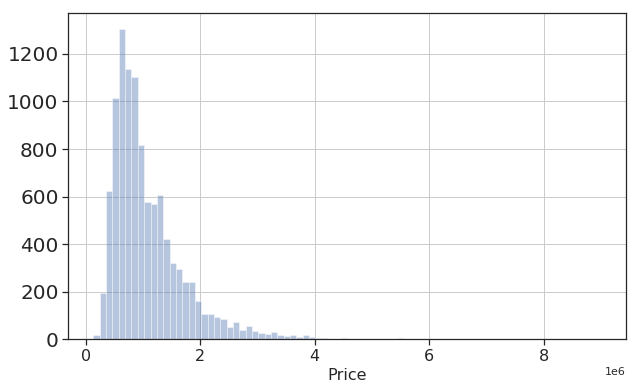

In [78]:
sns.set(style="ticks")

plt.figure(figsize=(10,6))
sns.distplot(price, bins=80, kde=False)

plt.ticklabel_format(style='sci', axis='x', scilimits=(6,6))
plt.xlabel('Price', fontsize=16)
plt.tick_params(axis='y', labelsize=20)
plt.tick_params(axis='x', labelsize=16)
plt.grid()
plt.show()

In [79]:
housing_clustered.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Latitude,Longitude
0,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-04-02,2.5,3067,...,Thrift / Vintage Store,Farmers Market,Convenience Store,Cultural Center,Coffee Shop,Japanese Restaurant,Vegetarian / Vegan Restaurant,Garden,-37.803703,144.99993
1,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,2017-04-03,2.5,3067,...,Thrift / Vintage Store,Farmers Market,Convenience Store,Cultural Center,Coffee Shop,Japanese Restaurant,Vegetarian / Vegan Restaurant,Garden,-37.803703,144.99993
2,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,2016-04-06,2.5,3067,...,Thrift / Vintage Store,Farmers Market,Convenience Store,Cultural Center,Coffee Shop,Japanese Restaurant,Vegetarian / Vegan Restaurant,Garden,-37.803703,144.99993
3,Abbotsford,124 Yarra St,3,h,1876000.0,S,Nelson,2016-07-05,2.5,3067,...,Thrift / Vintage Store,Farmers Market,Convenience Store,Cultural Center,Coffee Shop,Japanese Restaurant,Vegetarian / Vegan Restaurant,Garden,-37.803703,144.99993
4,Abbotsford,98 Charles St,2,h,1636000.0,S,Nelson,2016-08-10,2.5,3067,...,Thrift / Vintage Store,Farmers Market,Convenience Store,Cultural Center,Coffee Shop,Japanese Restaurant,Vegetarian / Vegan Restaurant,Garden,-37.803703,144.99993


In [80]:
map_housing = housing_clustered.groupby("Suburb")
map_housing = map_housing[['Suburb','Type', 'Rooms', 'BuildingArea', 'Price','Lattitude','Longtitude']]
counts = map_housing.size().to_frame(name='counts')
map_housing = counts.join(map_housing.mean()).reset_index()

#map_housing = map_housing[map_housing['counts']>10]

map_housing = map_housing.nlargest(10, 'Price')

map_housing.reset_index(inplace=True)

hgeo_df = getSuburbPolygon(names = map_housing['Suburb'], geo = nbh_geo, latitudes = map_housing.Lattitude, longitudes = map_housing.Longtitude)

latitude = map_housing['Lattitude'].mean()

longitude = map_housing['Longtitude'].mean()

Kooyong  /  KOOYONG
Middle Park  /  MIDDLE PARK 
Canterbury  /  CANTERBURY 
Deepdene  /  DEEPDENE 
Malvern  /  MALVERN 
Brighton  /  BRIGHTON 
Beaumaris  /  BEAUMARIS 
Balwyn  /  BALWYN
Balwyn North  /  BALWYN NORTH
Ivanhoe East  /  IVANHOE EAST


In [81]:
#nbh_count_colormap = linear.YlGnBu_09.scale(min(map_df['min_income_per_year']), max(map_df['min_income_per_year']))

h_locs_map = folium.Map(location=[latitude, longitude], zoom_start = 13)

style_function = lambda x: {
    'fillColor': '#F4FF61',
    'color': 'black',
    'weight': 1.5,
    'fillOpacity': 0.5
}

folium.GeoJson(hgeo_df, style_function = style_function ).add_to(h_locs_map )

#nbh_count_colormap.add_to(nbh_locs_map)
#nbh_count_colormap.caption = 'Reviews per montht'
#nbh_count_colormap.add_to(nbh_locs_map)

h_locs_map 

In [82]:
map_housing

,index,Suburb,counts,Rooms,BuildingArea,Price,Lattitude,Longtitude
0,160,Kooyong,1,4.000000,339.000000,3.080000e+06,-37.843910,145.033760
1,176,Middle Park,31,3.129032,154.064516,2.570194e+06,-37.850865,144.962594
2,54,Canterbury,35,3.657143,231.651429,2.556129e+06,-37.825020,145.075632
3,91,Deepdene,2,4.500000,271.000000,2.380000e+06,-37.812305,145.064000
4,166,Malvern,44,3.250000,193.643182,2.320250e+06,-37.859710,145.035279
5,39,Brighton,108,3.296296,205.717119,2.120531e+06,-37.909368,144.997888
6,24,Beaumaris,21,4.095238,237.523810,2.020357e+06,-37.981987,145.038771
7,19,Balwyn,80,3.450000,219.272000,2.003000e+06,-37.809519,145.082997
8,20,Balwyn North,101,3.881188,228.564356,1.998963e+06,-37.792754,145.086260
9,145,Ivanhoe East,16,3.750000,236.812500,1.997000e+06,-37.773592,145.059764


Let's have a look to the housing price in the short listed neighborhoods in the Airbnb section.

In [83]:
pd.options.display.float_format = '{:,.2f}'.format

In [84]:
short_list = ['Malvern','Hampton','Templestow Lower', 'Tullamarine', 'Melbourne', 'Healesville', 'Docklands','Southbank']

In [85]:
map_housing = housing_clustered.groupby("Suburb")
map_housing = map_housing[['Suburb','Type', 'Rooms', 'BuildingArea', 'Price','Lattitude','Longtitude']]
counts = map_housing.size().to_frame(name='counts')
map_housing = counts.join(map_housing.mean()).reset_index()

short_list_housing = map_housing.loc[map_housing['Suburb'].isin(short_list)]

In [86]:
short_list_housing

,Suburb,counts,Rooms,BuildingArea,Price,Lattitude,Longtitude
95,Docklands,1,2.00,128.00,"800,000.00",-37.82,144.95
129,Hampton,72,3.44,198.86,"1,756,263.89",-37.94,145.01
134,Healesville,1,3.00,156.60,"650,000.00",-37.65,145.53
166,Malvern,44,3.25,193.64,"2,320,250.00",-37.86,145.04
171,Melbourne,33,1.82,76.39,"586,606.06",-37.81,144.96
237,Southbank,27,2.11,89.11,"637,314.81",-37.83,144.97
259,Tullamarine,17,3.00,136.84,"619,500.00",-37.70,144.88


# Appendix

In [87]:
housing_df["Date"] =  pd.to_datetime(housing_df["Date"])

In [88]:
housing_df.describe()

,Rooms,Price,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Propertycount,bath_plot
count,"10,502.00","10,502.00","10,502.00","10,502.00","10,502.00","10,502.00","10,502.00","10,502.00","10,502.00","10,502.00","10,502.00","10,502.00","10,502.00",0.00
mean,3.11,"1,088,147.88",11.49,"3,115.52",3.09,1.66,1.71,446.04,152.36,"1,966.49",-37.80,144.99,"7,471.62",nan
std,0.96,"678,050.63",7.10,122.10,0.96,0.72,0.96,740.27,84.00,35.85,0.09,0.12,"4,378.88",nan
min,1.00,"131,000.00",0.00,"3,000.00",0.00,1.00,0.00,0.00,10.00,"1,820.00",-38.19,144.42,249.00,nan
25%,3.00,"640,000.00",6.40,"3,044.00",2.00,1.00,1.00,117.00,101.00,"1,950.00",-37.86,144.92,"4,380.00",nan
50%,3.00,"895,000.00",10.40,"3,084.00",3.00,2.00,2.00,389.00,133.00,"1,970.00",-37.80,145.00,"6,543.00",nan
75%,4.00,"1,335,000.00",14.30,"3,153.00",4.00,2.00,2.00,629.00,183.00,"2,000.00",-37.75,145.07,"10,331.00",nan
max,12.00,"9,000,000.00",48.10,"3,978.00",12.00,9.00,10.00,"21,715.00",999.00,"2,019.00",-37.40,145.53,"21,650.00",nan


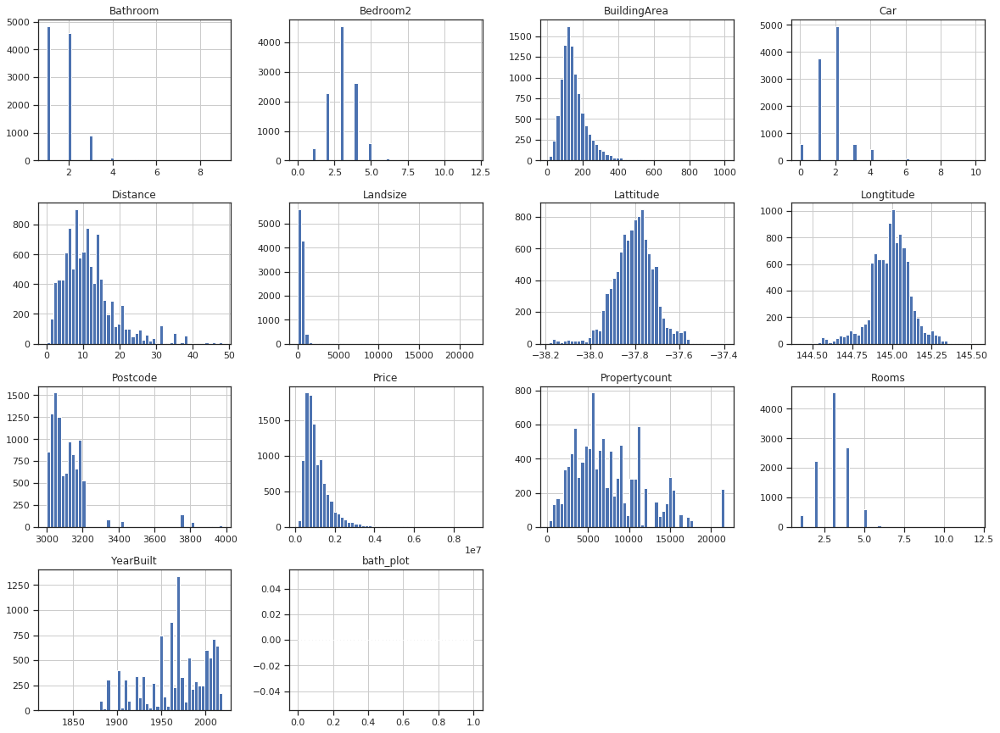

In [89]:
housing_df.hist(bins=50, figsize=(20,15))
plt.show()

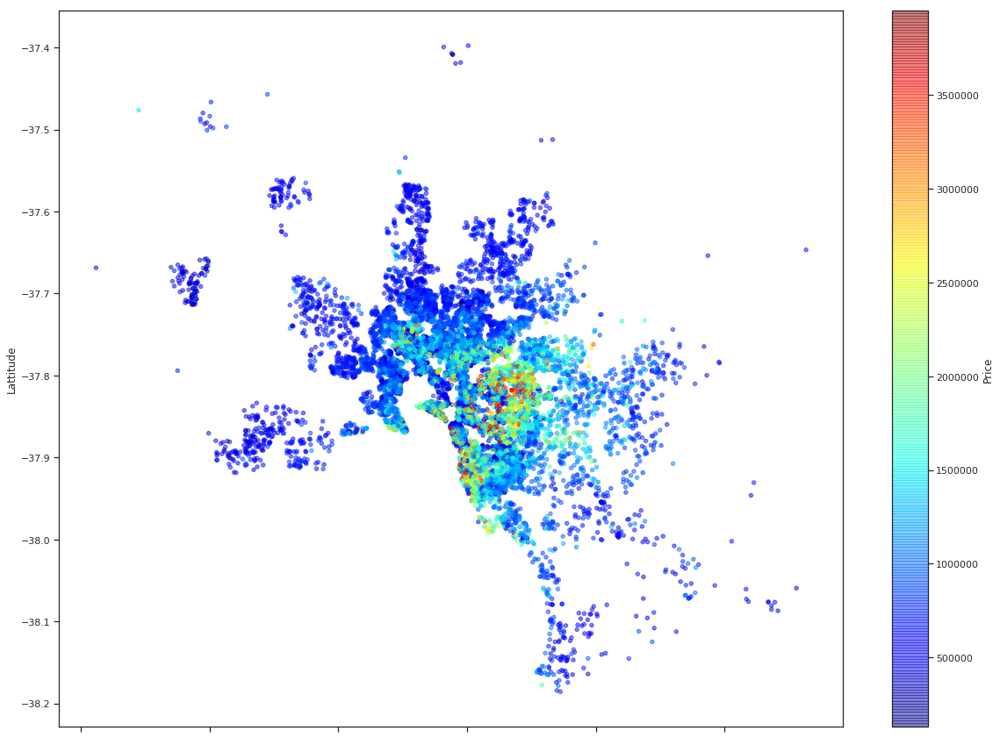

In [90]:
housing_df[housing_df['Price'] < 4000000].plot(kind="scatter" , x="Longtitude", y ="Lattitude", alpha=0.5, figsize=(20,15),
               c = "Price", cmap = plt.get_cmap("jet"), colorbar = True)

In [91]:
corr_matrix = housing_df.corr()

In [92]:
corr_matrix["Price"].sort_values(ascending=False)

Price            1.00
BuildingArea     0.51
Rooms            0.46
Bathroom         0.46
Bedroom2         0.45
Car              0.21
Longtitude       0.20
Landsize         0.08
Postcode         0.02
Propertycount   -0.06
Lattitude       -0.22
Distance        -0.25
YearBuilt       -0.32
bath_plot         nan
Name: Price, dtype: float64

map

In [93]:
locs_geometry = [Point(xy) for xy in zip(housing_df.Longtitude,
                                         housing_df.Lattitude)]
crs = {'init': 'epsg:4326'}
# Coordinate Reference Systems, "epsg:4326" is a common projection of WGS84 Latitude/Longitude
locs_gdf = gpd.GeoDataFrame(housing_df, crs=crs, geometry=locs_geometry)

In [94]:
housing_locs_map = folium.Map(location=[latitude, longitude], zoom_start=13, tiles='cartodbpositron')

feature_h = folium.FeatureGroup(name='house / cottage / villa')
feature_u = folium.FeatureGroup(name='unit / duplex')
feature_t = folium.FeatureGroup(name='townhouse')

for i, v in locs_gdf.iterrows():
    #popup = """
    #Location id : <b>%s</b><br>
    #Room type : <b>%s</b><br>
    #Neighbourhood : <b>%s</b><br>
    #Price : <b>%d</b><br>
    #""" % (v['id'], v['room_type'], v['suburb'], v['price'])
    
    if v['Type'] == 'h':
        folium.CircleMarker(location=[v['Lattitude'], v['Longtitude']],
                            radius=3,
                            #tooltip=popup,
                            color='#FFA41B',
                            weight=0,
                            fill=True,
                            fill_color='#FFA41B',
                            fill_opacity=0.3).add_to(feature_h)
    elif v['Type'] == 'u':
        folium.CircleMarker(location=[v['Lattitude'], v['Longtitude']],
                            radius=3,
                            #tooltip=popup,
                            color='#FF5151',
                            weight=0,
                            fill=True,
                            fill_color='#FF5151',
                            fill_opacity=0.3).add_to(feature_u)
    elif v['Type'] == 't':
        folium.CircleMarker(location=[v['Lattitude'], v['Longtitude']],
                            radius=3,
                            #tooltip=popup,
                            color='#9818D6',
                            weight=0,
                            fill=True,
                            fill_color='#9818D6',
                            fill_opacity=0.3).add_to(feature_t)

In [95]:
feature_h.add_to(housing_locs_map)
feature_u.add_to(housing_locs_map)
feature_t.add_to(housing_locs_map)
folium.LayerControl(collapsed=False).add_to(housing_locs_map)

In [96]:
housing_locs_map